### Лабораторная работа 1. Алгоритм Виолы-Джонса

ChatGPT:
Допустим, у тебя есть задача найти лица людей на фотографии. Алгоритм Виолы-Джонса может помочь тебе с этим. Он работает похожим образом, как ты можешь сделать, когда ищешь лица друзей на фотографии.

1. Сначала ты рассматриваешь разные части лица, такие как глаза, нос и рот, и думаешь над тем, какие признаки могут помочь тебе определить, что это именно лицо. Например, расположение глаз, ноздрей и форма рта может помочь идентифицировать лицо.

2. Потом ты создаешь свой особый "кусочек" или "правило" для каждой части лица. Например, ты можешь сказать, что если граница глаз расположена на определенном месте и имеет определенную форму, то это глаза человека.

3. Когда у тебя есть все эти "кусочки" для каждой части лица, ты идешь по всей фотографии и проверяешь, есть ли эти "кусочки" лица в каждой области. Если находишь все эти "кусочки" вместе, то ты можешь сказать, что это действительно лицо.

4. Чем больше правил (кусочков) ты создашь и применишь на фотографии, тем более точное определение лиц будет у алгоритма Виолы-Джонса.

5. Итак, принцип алгоритма Виолы-Джонса состоит в том, чтобы разбить задачу на более простые правила и проверить, есть ли эти правила для определения лица в каждой области изображения. Если все правила соблюдаются, то мы можем с уверенностью говорить, что это лицо.

Хабр: https://habr.com/ru/articles/133826/

Описание метода Viola Jones

Основные принципы, на которых основан метод, таковы:

1.   Используются изображения в интегральном представлении, что позволяет вычислять быстро необходимые объекты;

2.   Используются признаки Хаара, с помощью которых происходит поиск нужного объекта (в данном контексте, лица и его черт);

3.   Используется бустинг (от англ. boost – улучшение, усиление) для выбора наиболее подходящих признаков для искомого объекта на данной части изображения;

4.   Все признаки поступают на вход классификатора, который даёт результат «верно» либо «ложь»;

5.   Используются каскады признаков для быстрого отбрасывания окон, где не найдено лицо.


In [ ]:
import cv2

In [ ]:
# Загрузка каскадного классификатора
face_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/Методы распознавания образов/ЛР1/haarcascade_frontalface_default.xml')

In [ ]:
# Загрузка изображения
img = cv2.imread('/content/drive/MyDrive/Методы распознавания образов/ЛР1/arnold.jpg')

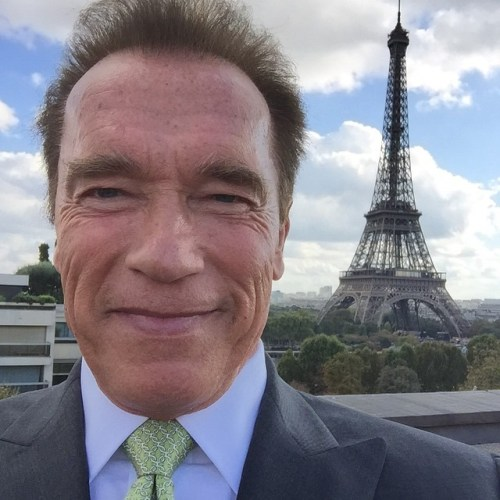

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
# Преобразование изображения в оттенки серого
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

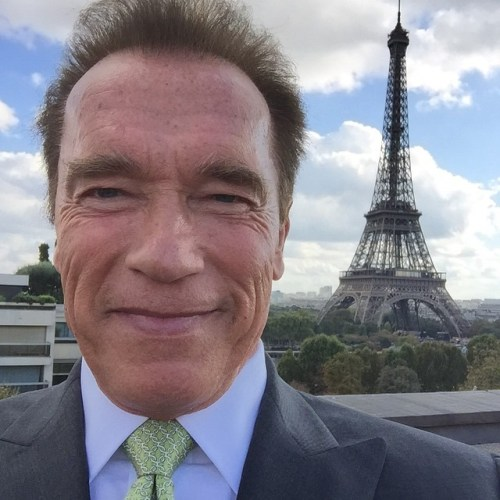

In [ ]:
# Изменение размера изображения
resized = cv2.resize(img, (500, 500))
cv2_imshow(resized)

In [ ]:
# Детекция лиц на изображении
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

In [ ]:
# Отрисовка прямоугольников вокруг лиц
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

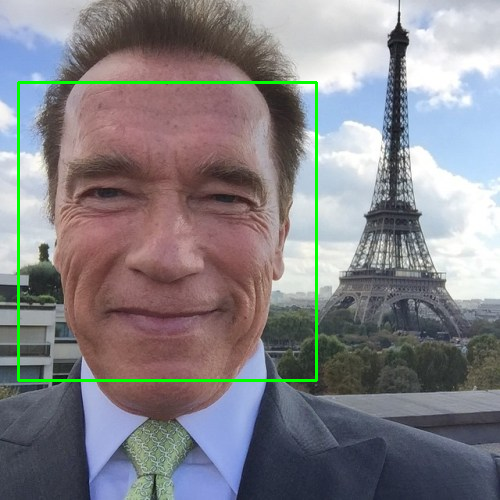

-1

In [ ]:
# Отображение изображения с прямоугольниками вокруг лиц
cv2_imshow(img)
cv2.waitKey()

In [ ]:
cv2.imwrite('/content/image.jpg', img)

True

### Лабораторная работа 2. Поиск ключевых точек изображения

In [ ]:
import cv2

In [ ]:
# Загрузка изображения
img = cv2.imread('/content/drive/MyDrive/Методы распознавания образов/ben_1.jpg')
height, width, channels = img.shape

In [ ]:
# Загрузка 2 изображения
img1 = cv2.imread('/content/drive/MyDrive/Методы распознавания образов/ben_2.jpg')

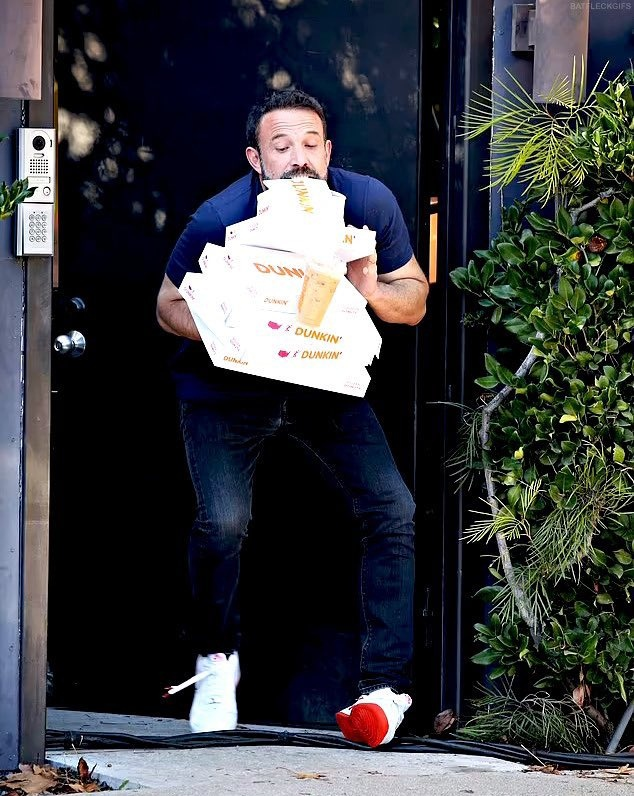

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

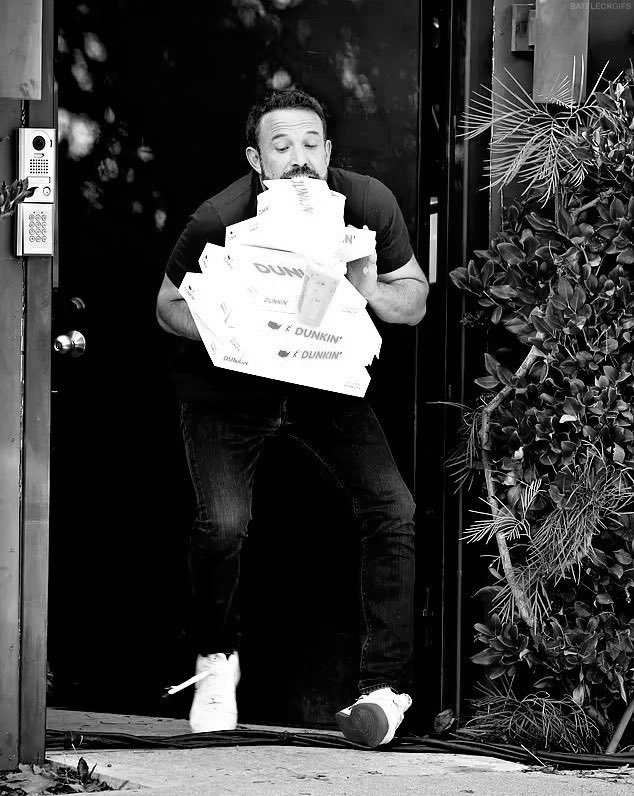

In [ ]:
# Преобразование изображения в оттенки серого
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

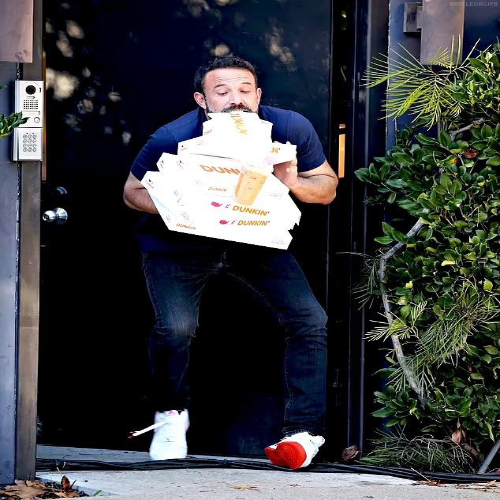

In [ ]:
# Изменение размера изображения
resized = cv2.resize(img, (500, 500))
cv2_imshow(resized)

Представь, что у тебя есть фотография ландшафта с разными объектами, и ты хочешь найти уникальные и особенные точки на этой фотографии. Такие точки могут быть, например, углами зданий или интересными текстурами. Алгоритм SIFT может помочь тебе с этим.

1. Сначала алгоритм SIFT представляет изображение в виде набора размытых версий (масштабов) этого изображения. Это делается для того, чтобы отлавливать особенности на разных уровнях детализации.

2. Затем алгоритм SIFT ищет в каждом масштабе "хорошие" точки, которые отличаются от окружающих. Для этого он анализирует разницу интенсивности пикселей в разных направлениях и находит точки с высокими градиентами или краями. Например, если у нас есть угол здания, то на этом углу будет большая разница в значениях пикселей между разными направлениями.

3. Затем алгоритм SIFT ориентирует найденные точки, чтобы сделать их устойчивыми к вращению изображения. Он определяет предпочтительное направление или ориентацию каждой точки, исходя из градиентов пикселей в окрестности. Это позволяет найти особые точки, которые будут одинаковыми независимо от вращения изображения.

4. Алгоритм SIFT также создает описания для каждой найденной точки. Описание представляет собой вектор, который содержит информацию о градиентах пикселей вокруг точки. Эти описания могут быть использованы для сравнения точек на разных изображениях.

5. Когда у тебя есть найденные ключевые точки и их описания, ты можешь использовать их для различных задач, таких как сопоставление изображений, поиск объектов или даже создание панорамного изображения.

Итак, алгоритм поиска ключевых точек SIFT ищет уникальные и особенные точки на изображении с помощью размытых версий и анализа интенсивностей пикселей и краев. Затем он ориентирует эти точки и создает их описания. В результате получается набор ключевых точек, которые могут быть использованы для различных целей.

##### SIFT

In [ ]:
# Создание объекта SIFT
sift = cv2.xfeatures2d.SIFT_create()

In [ ]:
# Нахождение ключевых точек и дескрипторов
keypoints, descriptors = sift.detectAndCompute(img, None)
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)

In [ ]:
# Отрисовка найденных ключевых точек на изображении
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None)

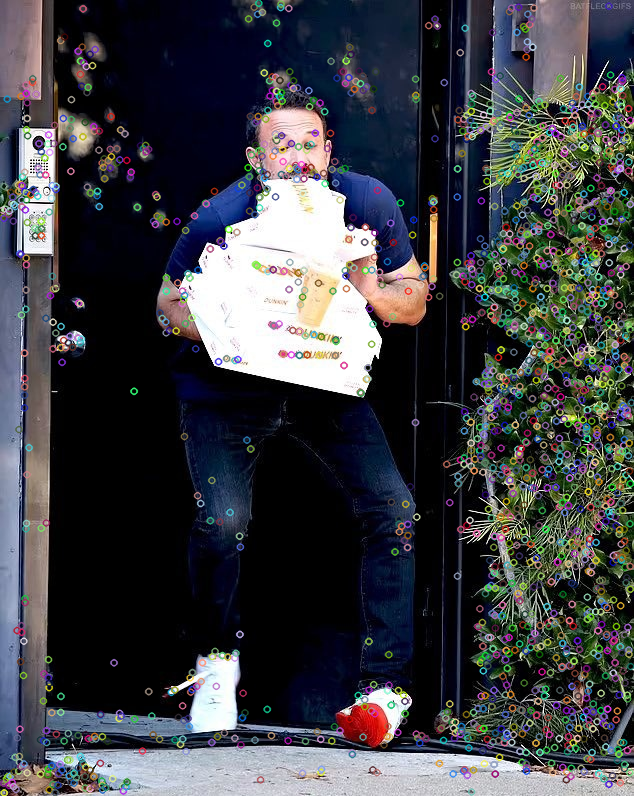

In [ ]:
cv2_imshow(img_with_keypoints)

In [ ]:
# Сохранение результата
cv2.imwrite('ben_image_with_keypoints.jpg', img_with_keypoints)
cv2.waitKey(0)

-1

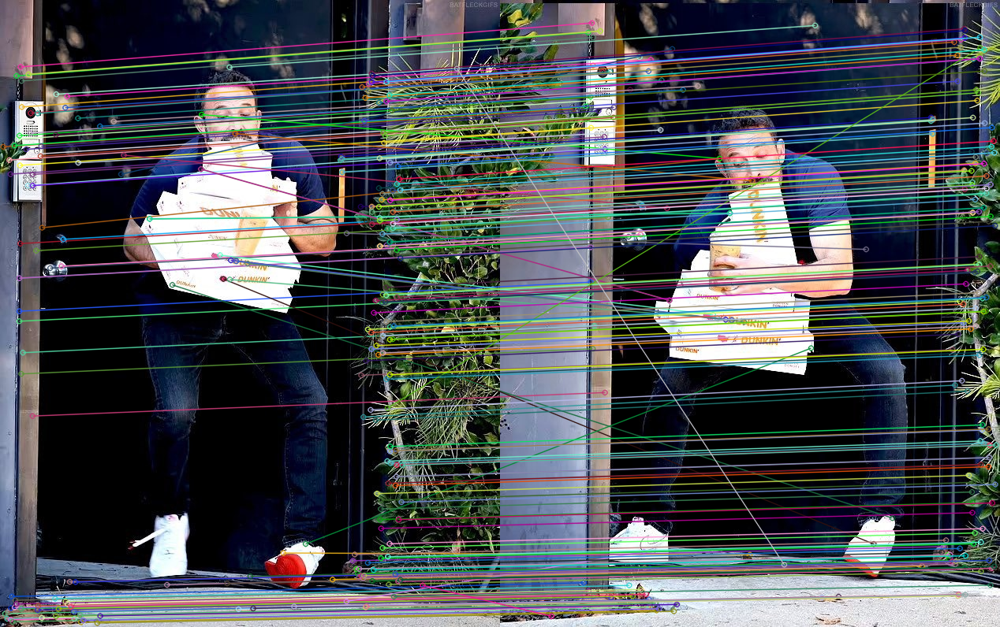

In [ ]:
# Использование программы FLANN Matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

# KNN Matcher
matches = flann.knnMatch(descriptors, descriptors1, k=2)
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)


# Построение графиков результатов сопоставления
result_img = cv2.drawMatches(img, keypoints, img1, keypoints1, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(result_img)

##### SURF

In [ ]:
# !CMake -OPENCV_ENABLE_NONFREE:BOOL=ON
# surf = cv2.xfeatures2d.SURF_create()
# kp, des = surf.detectAndCompute(img, None)

##### ORB

In [ ]:
orb = cv2.ORB_create()
keypoints, descriptors = orb.detectAndCompute(img, None)
keypoints1, descriptors1 = orb.detectAndCompute(img1, None)

In [ ]:
# Отрисовка найденных ключевых точек на изображении
# img_with_keypoints = cv2.drawKeypoints(img, kp, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_with_keypoints = cv2.drawKeypoints(img, keypoints, None)

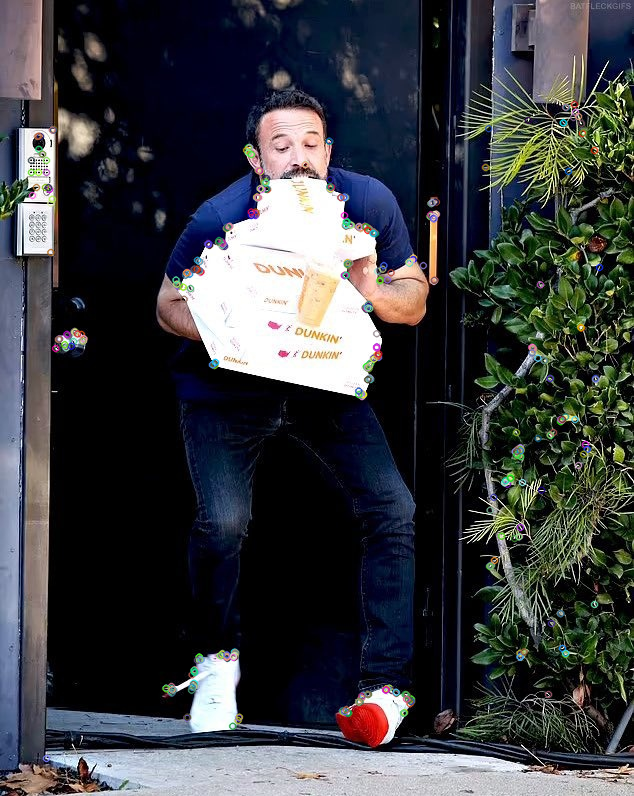

In [ ]:
cv2_imshow(img_with_keypoints)

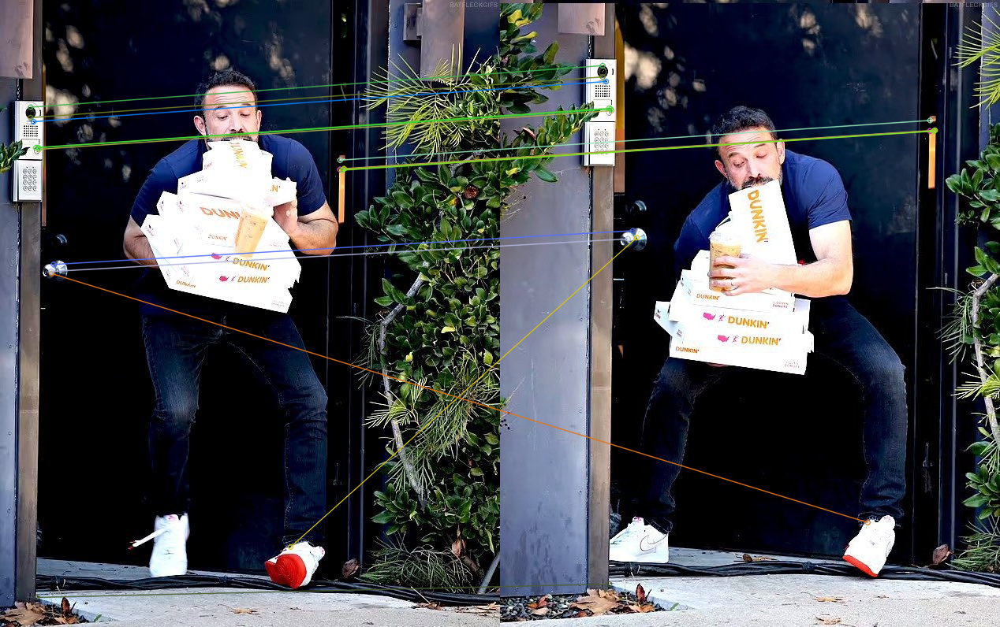

In [ ]:
# Использование программы FLANN Matcher
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

# KNN Matcher
matches = flann.knnMatch(descriptors, descriptors1, k=2)
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)


# Построение графиков результатов сопоставления
result_img = cv2.drawMatches(img, keypoints, img1, keypoints1, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(result_img)

##### FAST

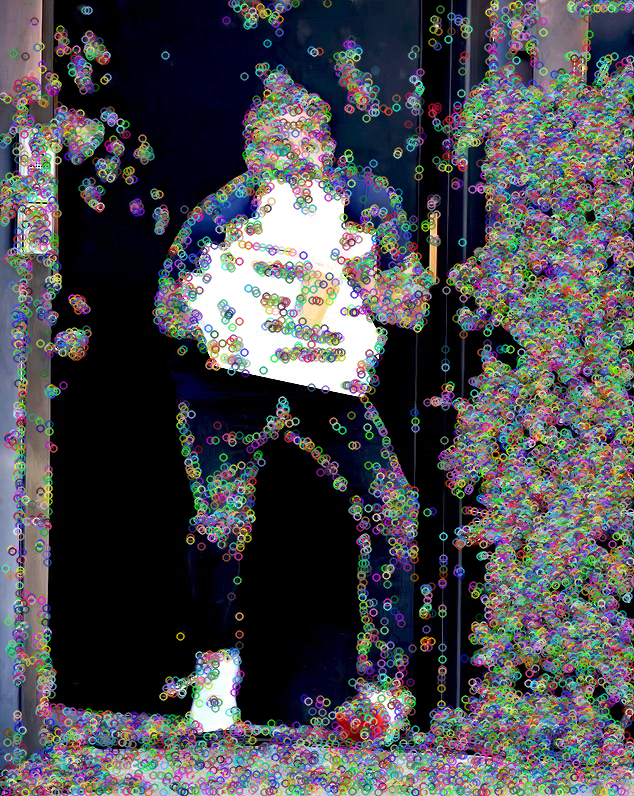

In [ ]:
# FAST  Features from Accelerated Segment Test
fast = cv2.FastFeatureDetector_create()
kps = fast.detect(img, None)
img_fast=cv2.drawKeypoints(img, kps, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(img_fast)

### Лабораторная работа 3. Классификация объектов на изображении

In [ ]:
!pip install foolbox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.8 MB/s eta 0:00:00


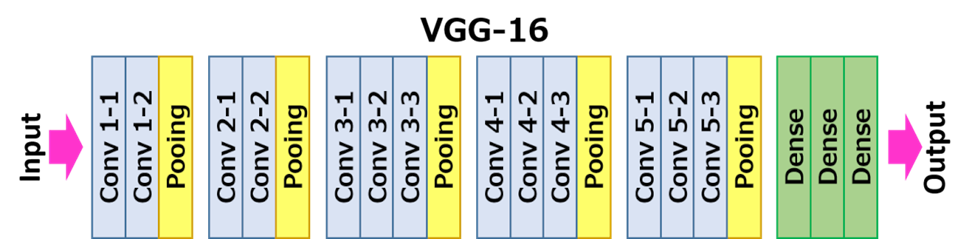

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import matplotlib.pyplot as plt
from foolbox import TensorFlowModel, Model
from foolbox.attacks import LinfFastGradientAttack

In [ ]:
model = VGG16(weights='imagenet')

553467096/553467096 [==============================] - 8s 0us/step


35363/35363 [==============================] - 0s 0us/step
Класс объекта: tiger - 90.44020175933838
Класс объекта: tiger_cat - 9.513019025325775
Класс объекта: lynx - 0.029789117979817092


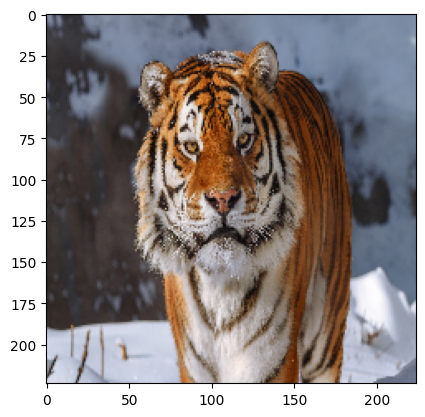

In [ ]:
img_path = '/content/drive/MyDrive/amurskiy_tigr.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = np.array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)
preds = model.predict(x)
answer = decode_predictions(preds, top=3)
for i in range(3):
    print('Класс объекта:', answer[0][i][1:][0], '-', answer[0][i][1:][1]*100)
plt.imshow(img)
pass


In [ ]:
# Реализовать наложение шума на изображение
pre = dict(flip_axis=-1, mean=[103.939, 116.779, 123.68])  # RGB to BGR
fmodel: Model = TensorFlowModel(model, bounds=(0, 255), preprocessing=pre)

# apply the attack
attack = LinfFastGradientAttack()

#так как преобразования к изображению применяются внутри модели foolbox, еще раз поместим его в переменную х
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
banana_image, banana_label = tf.convert_to_tensor(x), tf.convert_to_tensor(tf.cast([954], tf.int64))

#Зададим значения допустимых возмущений
epsilons = [0.0, 0.001, 0.01, 0.03, 0.1, 0.3, 0.5, 1.0, 2.0, 5.0, 10.0]

raw_advs, clipped_advs, success = attack(fmodel, banana_image, banana_label, epsilons=epsilons)


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


1/1 [==============================] - 0s 27ms/step
Predicted: [('n02129604', 'tiger', 0.937711), ('n02128757', 'snow_leopard', 0.028392026), ('n02123159', 'tiger_cat', 0.025328992)]


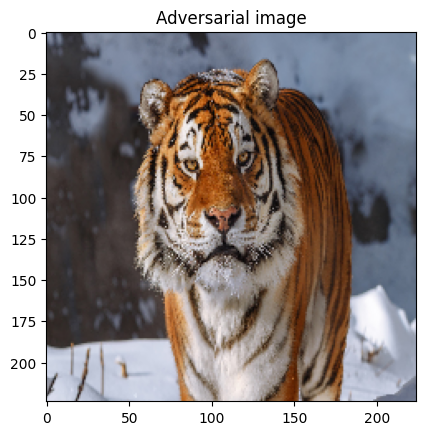

1/1 [==============================] - 0s 25ms/step
Predicted: [('n02129604', 'tiger', 0.9377586), ('n02128757', 'snow_leopard', 0.028381228), ('n02123159', 'tiger_cat', 0.02529928)]


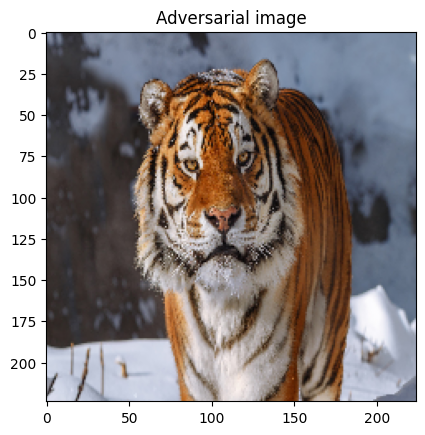

1/1 [==============================] - 0s 25ms/step
Predicted: [('n02129604', 'tiger', 0.93818307), ('n02128757', 'snow_leopard', 0.028284645), ('n02123159', 'tiger_cat', 0.025035994)]


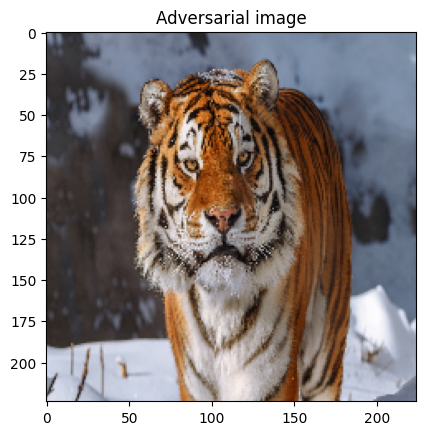

1/1 [==============================] - 0s 26ms/step
Predicted: [('n02129604', 'tiger', 0.9390923), ('n02128757', 'snow_leopard', 0.028079329), ('n02123159', 'tiger_cat', 0.024467226)]


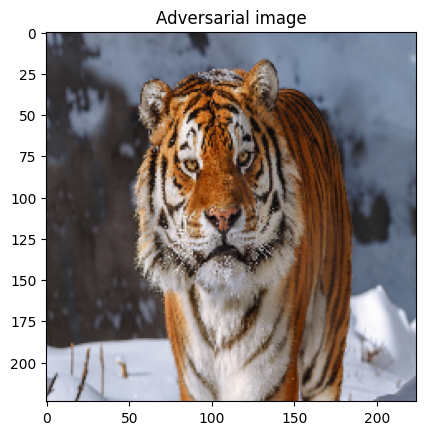

1/1 [==============================] - 0s 29ms/step
Predicted: [('n02129604', 'tiger', 0.94226515), ('n02128757', 'snow_leopard', 0.027270287), ('n02123159', 'tiger_cat', 0.022563532)]


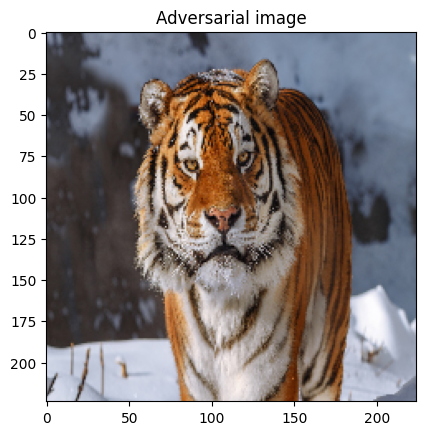

1/1 [==============================] - 0s 28ms/step
Predicted: [('n02129604', 'tiger', 0.95051116), ('n02128757', 'snow_leopard', 0.02487708), ('n02123159', 'tiger_cat', 0.017863315)]


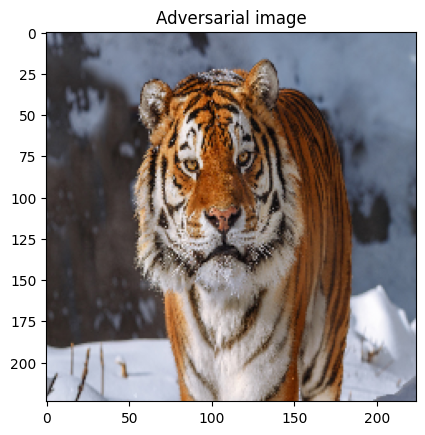

1/1 [==============================] - 0s 66ms/step
Predicted: [('n02129604', 'tiger', 0.95581627), ('n02128757', 'snow_leopard', 0.023487788), ('n02123159', 'tiger_cat', 0.0146737425)]


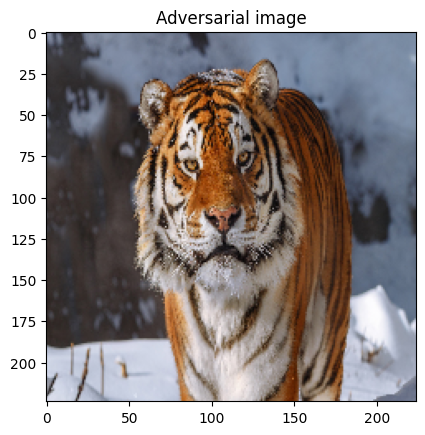

1/1 [==============================] - 0s 25ms/step
Predicted: [('n02129604', 'tiger', 0.96485627), ('n02128757', 'snow_leopard', 0.02033233), ('n02123159', 'tiger_cat', 0.009829775)]


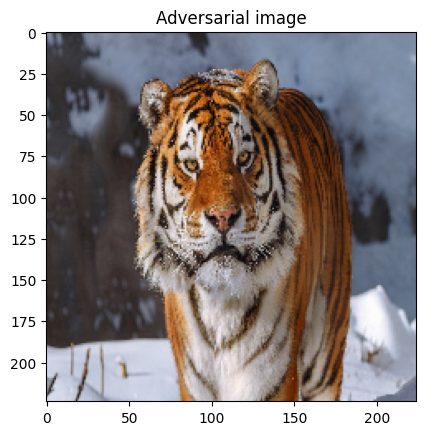

1/1 [==============================] - 0s 29ms/step
Predicted: [('n02129604', 'tiger', 0.97968525), ('n02128757', 'snow_leopard', 0.009671531), ('n02123159', 'tiger_cat', 0.0056246943)]


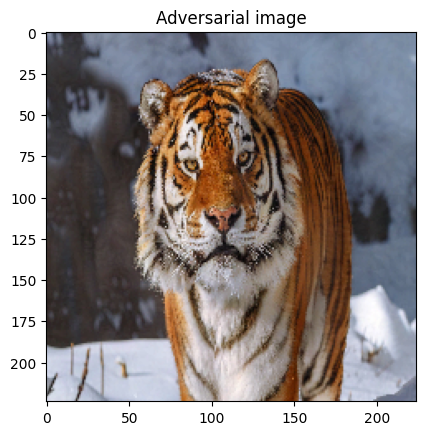

1/1 [==============================] - 0s 33ms/step
Predicted: [('n02129604', 'tiger', 0.76065433), ('n04367480', 'swab', 0.17465809), ('n02110958', 'pug', 0.010507796)]


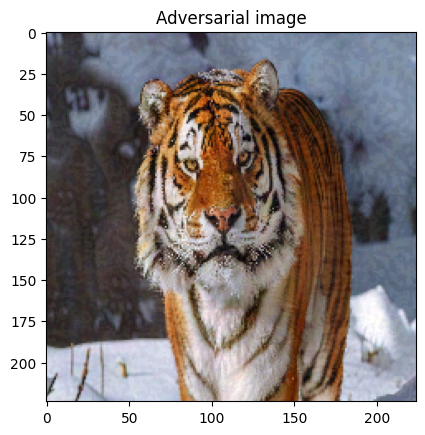

1/1 [==============================] - 0s 25ms/step
Predicted: [('n04367480', 'swab', 0.4529351), ('n02129604', 'tiger', 0.2152407), ('n02110958', 'pug', 0.07189742)]


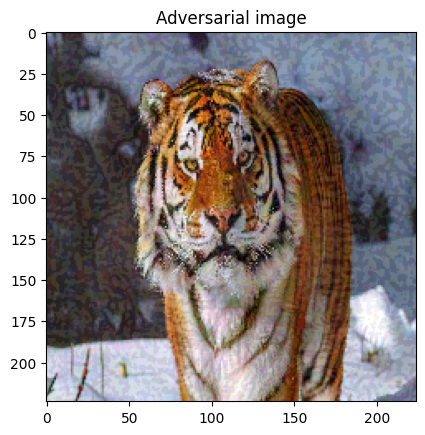

In [ ]:
# Проанализировать как нейронная сеть будет классифицировать зашумленное изображение и на каком этапе начнет ошибаться в классификации
for sample in raw_advs:
  preds = model.predict(sample)
  print('Predicted:', decode_predictions(preds, top=3)[0])
  plt.figure()
  plt.imshow(sample[0]/ 255)
  plt.title('Adversarial image')
  plt.show()

### Лабораторная работа 4. Автоэнкодер

Autoencoder (автокодер, автоэнкодер, AE) – нейронная сеть, которая копирует входные данные на выход. По архитектуре похож на персептрон. Автоэнкодеры сжимают входные данные для представления их в latent-space (скрытое пространство), а затем восстанавливают из этого представления output (выходные данные). Цель – получить на выходном слое отклик, наиболее близкий к входному.
Отличительная особенность автоэнкодеров — количество нейронов на входе и на выходе совпадает.
Автокодер состоит из двух частей:
1.	Энкодер: отвечает за сжатие входа в latent-space.
2.	Декодер: предназначен для восстановления ввода из latent-space.


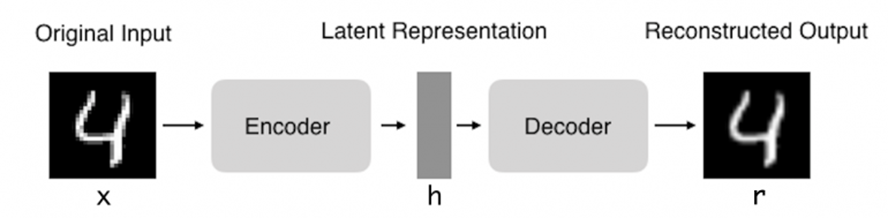

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Model

In [ ]:
def preprocess(array):
    """
    Нормализует массив и преобразует его в соответствующий формат.
    """
    array = array.astype("float32") / 255.0
    array = np.reshape(array, (len(array), 28, 28, 1))
    return array

def noise(array):
    """
    Добавляем случайный шум к каждому изображению в массиве.
    """

    noise_factor = 0.1
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

def display(array1, array2):
    """
    Отобразим десять случайных изображений из массива
    """

    n = 10

    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        ax = plt.subplot(2, n, i + 1)
        plt.imshow(image1.reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(image2[:, :, 0])
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

11490434/11490434 [==============================] - 0s 0us/step


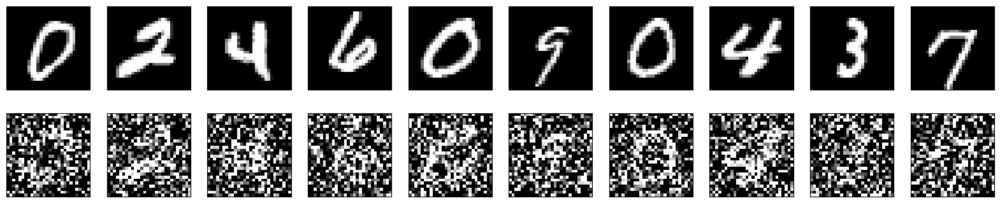

In [ ]:
# Так как для кодирования и декодирования нам нужны только изображения из набора данных, мы не будем использовать метки
(train_data, _), (test_data, _) = mnist.load_data()

# Нормализация изображений
train_data = preprocess(train_data)
test_data = preprocess(test_data)

# Создадим копию данных с добавленным шумом
noisy_train_data = noise(train_data)
noisy_test_data = noise(test_data)

# Отобразим данные и их версии с добавленным шумом
display(train_data, noisy_train_data)

In [ ]:
#Архитектура нейронной сети:
input = layers.Input(shape=(28, 28, 1))

# Энкодер
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)


# Декодер
x = layers.UpSampling2D(size=(2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = layers.UpSampling2D(size=(2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x)

# output layer
decoded = layers.Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)

# Модель автоэнкодера
autoencoder = Model(input, x)
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")
autoencoder.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 64)          0         
 g2D)                                                            
                                                                 
 up_sampling2d (UpSampling2  (None, 14, 14, 64)        0     

In [ ]:
# Обучим автоэнкодер, используя зашумленные изображения и чистые изображения в качестве целевых. Необходимо, чтобы автоэнкодер научился подавлять шум.
autoencoder.fit(
    x=noisy_train_data,
    y=train_data,
    epochs=50,
    batch_size=128,
    shuffle=True,
    validation_data=(noisy_test_data, test_data),
)

Epoch 1/50
469/469 [==============================] - 12s 22ms/step - loss: 0.3629 - val_loss: 0.3367
Epoch 2/50
469/469 [==============================] - 10s 21ms/step - loss: 0.2303 - val_loss: 0.2131
Epoch 3/50
469/469 [==============================] - 11s 23ms/step - loss: 0.2093 - val_loss: 0.2052
Epoch 4/50
469/469 [==============================] - 10s 20ms/step - loss: 0.2059 - val_loss: 0.2025
Epoch 5/50
469/469 [==============================] - 10s 21ms/step - loss: 0.2051 - val_loss: 0.2050
Epoch 6/50
469/469 [==============================] - 10s 21ms/step - loss: 0.2017 - val_loss: 0.1996
Epoch 7/50
469/469 [==============================] - 10s 21ms/step - loss: 0.1994 - val_loss: 0.1967
Epoch 8/50
469/469 [==============================] - 10s 21ms/step - loss: 0.2001 - val_loss: 0.1959
Epoch 9/50
469/469 [==============================] - 10s 21ms/step - loss: 0.1963 - val_loss: 0.1955
Epoch 10/50
469/469 [==============================] - 10s 21ms/step - loss: 0.196

313/313 [==============================] - 1s 2ms/step


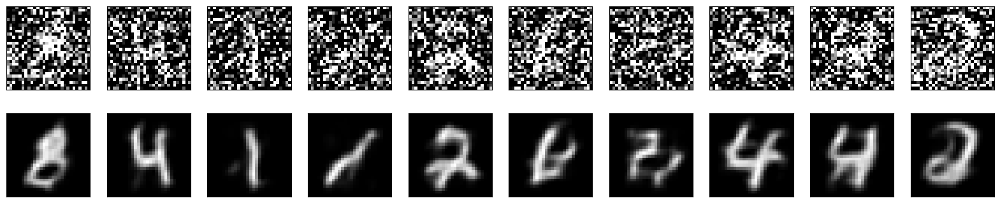

In [ ]:
# Теперь сделаем прогноз на основе зашумленных данных и отобразим результаты автоэнкодера. Автоэнкодер должен подавлять шум.
predictions = autoencoder.predict(noisy_test_data)
display(noisy_test_data, predictions)

### Лабораторная работа 5. Трансферное обучение

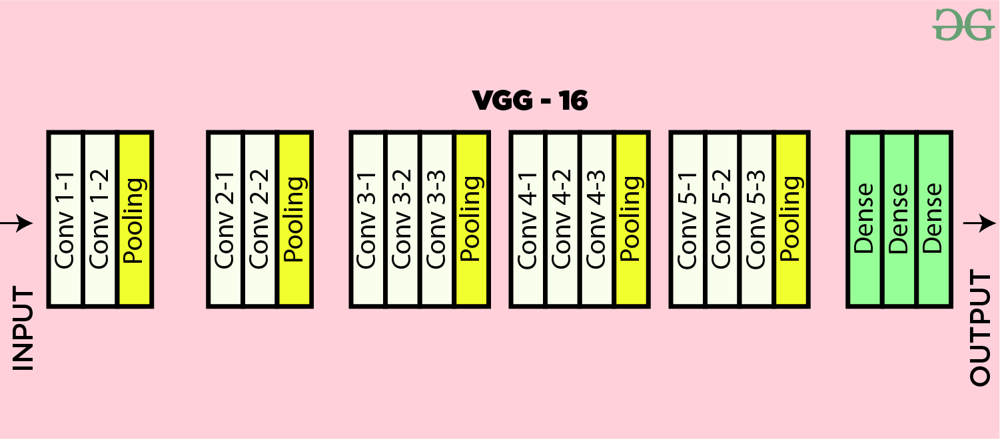

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Input, Flatten, Dense
from keras.optimizers import Adam

In [ ]:
from keras.layers import Conv2D, Flatten, Dense
from keras.models import Model
import numpy as np
from keras.datasets import cifar10
from keras.utils import to_categorical
from keras.layers import Dense, Dropout, Flatten
from keras.optimizers import SGD
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers

In [ ]:
# Загрузка набора данных CIFAR-10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Data preprocessing
X_train = X_train / 255.0
X_test = X_test / 255.0
y_train = to_categorical(y_train, 10)
y_test = to_categorical(y_test, 10)

# Расширение данных с помощью ImageDataGenerator
datagen = ImageDataGenerator(
    # задает диапазон углов случайного поворота
    rotation_range=15,
    # диапазон случайных сдвигов по горизонтали и вертикали
    width_shift_range=0.1,
    height_shift_range=0.1,
    # случайным образом переворачиваем изображение по горизонтали
    horizontal_flip=True
)
datagen.fit(X_train)

170498071/170498071 [==============================] - 4s 0us/step


In [ ]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(32, 32, 3))

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
#написать код – архитектуру нейронной сети
x = vgg_model.get_layer('block1_conv1').output
x = vgg_model.get_layer('block1_conv2')(x)
x = vgg_model.get_layer('block1_pool')(x)

x = Conv2D(128, 3, activation='relu', padding='same')(x)
x = Conv2D(128, 3, activation='relu', padding='same')(x)
x = vgg_model.get_layer('block2_pool')(x)

x = Conv2D(256, 3, activation='relu', padding='same')(x)
x = Conv2D(256, 3, activation='relu', padding='same')(x)
x = Conv2D(256, 3, activation='relu', padding='same')(x)
x = vgg_model.get_layer('block3_pool')(x)

x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = vgg_model.get_layer('block4_pool')(x)

x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = Conv2D(512, 3, activation='relu', padding='same')(x)
x = vgg_model.get_layer('block5_pool')(x)

# Добавление полностью подключенного слоя и слоя с  Dropout
x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(4096, activation='relu')(x)
x = Dropout(0.5)(x)

# задача классификации состоит из 10 классов
x = Dense(units=10, activation='softmax')(x)

In [ ]:
# Создание новой модели
model = Model(inputs=vgg_model.input, outputs=x)

# Использование оптимизатора SGD
sgd = SGD(learning_rate=0.0001, momentum=0.9)
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=sgd)

In [ ]:
# Заморозьте первые 10 слоев
for layer in model.layers[:10]:
    layer.trainable = False

# Вывод имени каждого слоя и информации о том, является ли он обучаемым
for layer in model.layers:
   print(layer.name, layer.trainable)
# Модели обучения
model.fit(datagen.flow(X_train, y_train, batch_size=20), epochs=50)

input_1 False
block1_conv1 False
block1_conv2 False
block1_pool False
conv2d False
conv2d_1 False
block2_pool False
conv2d_2 False
conv2d_3 False
conv2d_4 False
block3_pool True
conv2d_5 True
conv2d_6 True
conv2d_7 True
block4_pool True
conv2d_8 True
conv2d_9 True
conv2d_10 True
block5_pool True
flatten True
dense True
dropout True
dense_1 True
dropout_1 True
dense_2 True
Epoch 1/50
2500/2500 [==============================] - 89s 32ms/step - loss: 2.3014 - accuracy: 0.1102
Epoch 2/50
2500/2500 [==============================] - 80s 32ms/step - loss: 2.2960 - accuracy: 0.1331
Epoch 3/50
2500/2500 [==============================] - 80s 32ms/step - loss: 2.1497 - accuracy: 0.1771
Epoch 4/50
2500/2500 [==============================] - 82s 33ms/step - loss: 1.9413 - accuracy: 0.2235
Epoch 5/50
2500/2500 [==============================] - 80s 32ms/step - loss: 1.8586 - accuracy: 0.2676
Epoch 6/50
2500/2500 [==============================] - 81s 32ms/step - loss: 1.7364 - accuracy: 0.3335
E

In [ ]:
model.evaluate(X_test, y_test)

313/313 [==============================] - 5s 12ms/step - loss: 0.6265 - accuracy: 0.8030


[0.6264550089836121, 0.8029999732971191]

### Лабораторная работа 6. U-Net

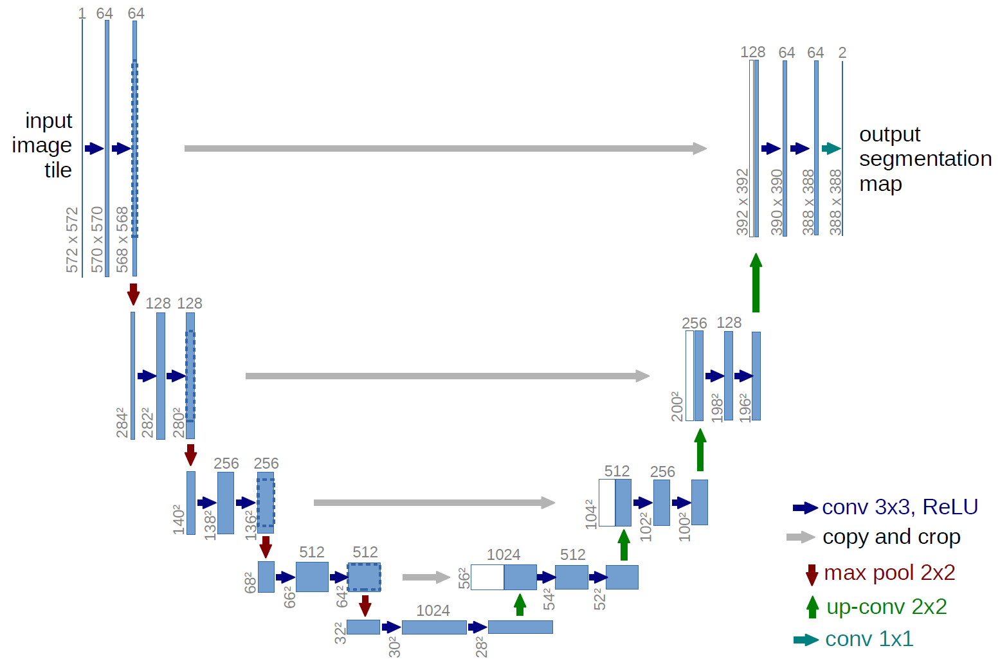

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from skimage import io
import os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def download_data(path):
  data = []
  for path_image in sorted(os.listdir(path=path)):
    image = Image.open(path + path_image) # Открываем изображение
    data.append(np.array(image)) # Загружаем пиксели
  return data

X_train = download_data(r"/content/drive/MyDrive/Методы распознавания образов/Resized images/Images/Train/")
Y_train = download_data(r"/content/drive/MyDrive/Методы распознавания образов/Resized images/Masks/Train/")
X_test =  download_data(r"/content/drive/MyDrive/Методы распознавания образов/Resized images/Images/Test/")
Y_test =  download_data(r"/content/drive/MyDrive/Методы распознавания образов/Resized images/Masks/Test/")

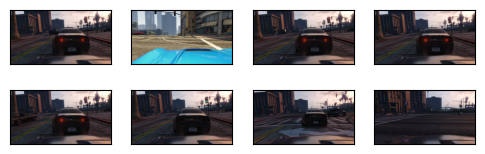

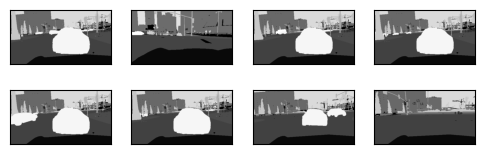

In [ ]:
plt.figure(figsize=(6,4))
for i in range(8):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_train[i])

plt.figure(figsize=(6,4))
for i in range(8):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_train[i])

In [ ]:
X_train_pred = np.array(X_train).reshape([len(X_train), 256, 480, 3])/255
X_test_pred = np.array(X_test).reshape([len(X_test), 256, 480, 3])/255
Y_train_pred = []

Y_train_pred = np.array(Y_train)
Y_test_pred = np.array(Y_test)

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from tensorflow.keras import layers

In [ ]:
vgg_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 480, 3))

conv1 = vgg_model.get_layer('block1_conv1').output
conv2 = vgg_model.get_layer('block1_conv2') (conv1)
conv3 = vgg_model.get_layer('block1_conv2') (conv2)
batch1 = BatchNormalization() (conv3)
drop1 = Dropout(0.5) (batch1)
block_1 = layers.add([conv1, drop1])
pool1 = vgg_model.get_layer('block1_pool') (block_1)

conv4 = vgg_model.get_layer('block2_conv1') (pool1)
conv5 = vgg_model.get_layer('block2_conv2') (conv4)
conv6 = vgg_model.get_layer('block2_conv2') (conv5)
batch2 = BatchNormalization() (conv6)
drop2 = Dropout(0.5) (batch2)
block_2 = layers.add([conv4, drop2])
pool2 = vgg_model.get_layer('block2_pool') (block_2)

conv7 = vgg_model.get_layer('block3_conv1') (pool2)
conv8 = vgg_model.get_layer('block3_conv2') (conv7)
conv9 = vgg_model.get_layer('block3_conv3') (conv8)
batch3 = BatchNormalization() (conv9)
drop3 = Dropout(0.5) (batch3)
block_3 = layers.add([conv7, drop3])
pool3 = vgg_model.get_layer('block3_pool') (block_3)

conv10 = vgg_model.get_layer('block4_conv1') (pool3)
conv11 = vgg_model.get_layer('block4_conv2') (conv10)
conv12 = vgg_model.get_layer('block4_conv3') (conv11)
batch4 = BatchNormalization() (conv12)
drop4 = Dropout(0.5) (batch4)
block_4 = layers.add([conv10, drop4])
pool4 = vgg_model.get_layer('block4_pool') (block_4)

conv13 = vgg_model.get_layer('block5_conv1') (pool4)
conv14 = vgg_model.get_layer('block5_conv2') (conv13)
conv15 = vgg_model.get_layer('block5_conv3') (conv14)
batch5 = BatchNormalization() (conv15)
drop5 = Dropout(0.5) (batch5)
block_5 = layers.add([conv13, drop5])
pool5 = vgg_model.get_layer('block5_pool') (block_5)


up1 = UpSampling2D(size = (2,2)) (pool5)
merge1 = concatenate([conv13, up1], axis = 3)
conv16 = Conv2D(64, 5, activation = 'relu', padding = 'same') (merge1)
conv17 = Conv2D(64, 5, activation = 'relu', padding = 'same') (conv16)
conv18 = Conv2D(64, 5, activation = 'relu', padding = 'same') (conv17)
batch6 = BatchNormalization() (conv18)
drop6 = Dropout(0.5) (batch6)
block_6 = layers.add([conv16, drop6])

up2 = UpSampling2D(size = (2,2)) (block_6)
merge2 = concatenate([conv10, up2], axis = 3)
conv19 = Conv2D(32, 3, activation = 'relu', padding = 'same') (merge2)
conv20 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv19)
conv21 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv20)
batch7 = BatchNormalization() (conv21)
drop7 = Dropout(0.5) (batch7)
block_7 = layers.add([conv19, drop7])

up3 = UpSampling2D(size = (2,2)) (block_7)
merge3 = concatenate([conv7, up3], axis = 3)
conv22 = Conv2D(32, 3, activation = 'relu', padding = 'same') (merge3)
conv23 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv22)
conv24 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv23)
batch8 = BatchNormalization() (conv24)
drop8 = Dropout(0.5) (batch8)
block_8 = layers.add([conv22, drop8])

up4 = UpSampling2D(size = (2,2)) (block_8)
merge4 = concatenate([conv4, up4], axis = 3)
conv25 = Conv2D(32, 3, activation = 'relu', padding = 'same') (merge4)
conv26 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv25)
conv27 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv26)
batch9 = BatchNormalization() (conv27)
drop9 = Dropout(0.5) (batch9)
block_9 = layers.add([conv25, drop9])

up5 = UpSampling2D(size = (2,2)) (block_9)
merge5 = concatenate([conv1, up5], axis = 3)
conv28 = Conv2D(32, 3, activation = 'relu', padding = 'same') (merge5)
conv29 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv28)
conv30 = Conv2D(32, 3, activation = 'relu', padding = 'same') (conv29)
batch10 = BatchNormalization() (conv30)
drop10 = Dropout(0.2) (batch10)
block_9 = layers.add([conv28, drop10])

conv31 = Conv2D(35, 3, activation = 'softmax', padding = 'same')(block_9)

model = Model(inputs = vgg_model.input, outputs = conv31)

model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# for layer in model.layers[:19]:
#     layer.trainable = False

for layer in vgg_model.layers:
    layer.trainable = False

In [ ]:
model.fit(X_train_pred, Y_train_pred, batch_size=10, epochs=50)

Epoch 1/50
41/41 [==============================] - 95s 1s/step - loss: 1.5454 - accuracy: 0.6077
Epoch 2/50
41/41 [==============================] - 44s 1s/step - loss: 1.0013 - accuracy: 0.7059
Epoch 3/50
41/41 [==============================] - 44s 1s/step - loss: 0.8974 - accuracy: 0.7321
Epoch 4/50
41/41 [==============================] - 44s 1s/step - loss: 0.8667 - accuracy: 0.7374
Epoch 5/50
41/41 [==============================] - 44s 1s/step - loss: 0.8542 - accuracy: 0.7395
Epoch 6/50
41/41 [==============================] - 44s 1s/step - loss: 0.7752 - accuracy: 0.7657
Epoch 7/50
41/41 [==============================] - 44s 1s/step - loss: 0.7183 - accuracy: 0.7829
Epoch 8/50
41/41 [==============================] - 44s 1s/step - loss: 0.7051 - accuracy: 0.7878
Epoch 9/50
41/41 [==============================] - 44s 1s/step - loss: 0.6968 - accuracy: 0.7909
Epoch 10/50
41/41 [==============================] - 44s 1s/step - loss: 0.6320 - accuracy: 0.8125
Epoch 11/50
41/41 [

In [ ]:
model.evaluate(X_test_pred, Y_test_pred, batch_size=1)

201/201 [==============================] - 7s 32ms/step - loss: 3.3607 - accuracy: 0.5480


[3.360711097717285, 0.5480400323867798]

In [ ]:
out = model.predict(np.array(X_test_pred[:100]), batch_size=1)

100/100 [==============================] - 3s 29ms/step


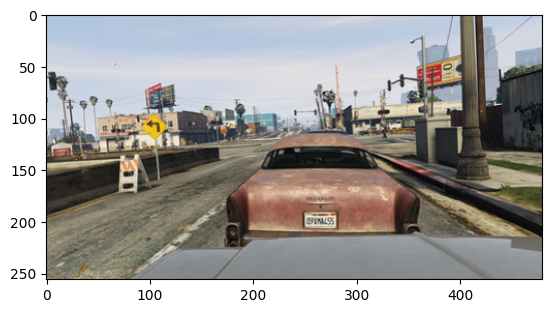

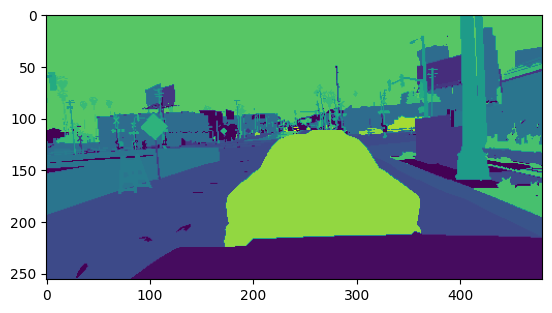

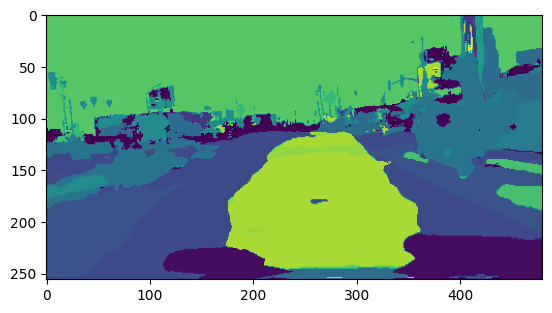

In [ ]:
I = 1
plt.imshow(np.array(X_test[I]))
plt.show()
plt.imshow(np.array(Y_test[I]))
plt.show()
plt.imshow(np.argmax(out[I], axis = -1))
plt.show()